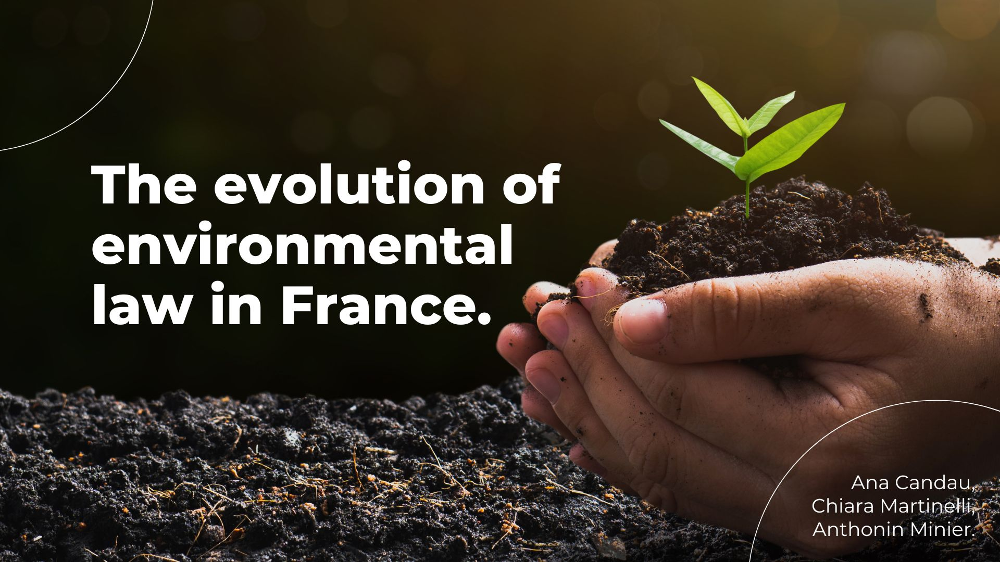

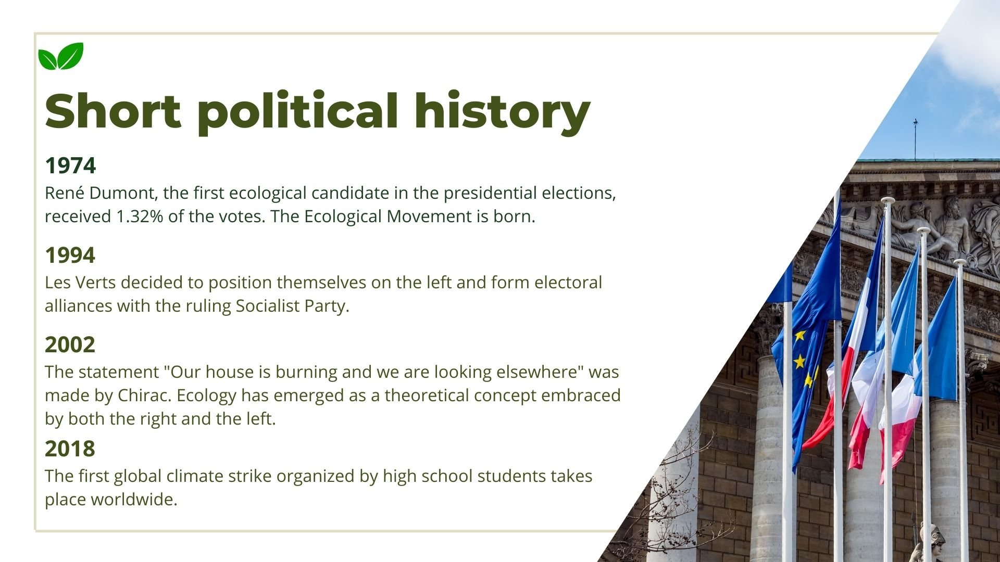

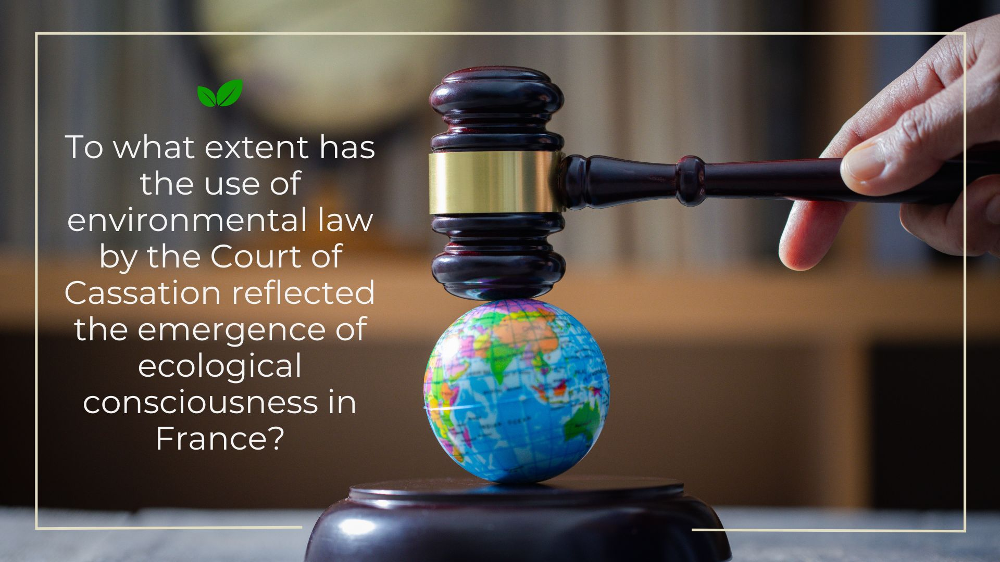

Let's start by scraping the data. We are going to do this through an API in judilibre. The goal is to extract all the court decisions that have the word "code de l'environnement" referenced or/and applied for the past 23 years (since January 1st 2020 to november 2023). We will be working with 849 decisions to start with.

**First step : Scraping data**

In [ ]:
from requests_oauthlib import OAuth2Session
import requests
import pandas as pd
import json
import regex as re


API_HOST = "https://sandbox-api.aife.economie.gouv.fr"  # All data necessary to create session
TOKEN_URL = 'https://sandbox-oauth.aife.economie.gouv.fr/api/oauth/token'
client_id = "b800ee81-4b08-4b7c-9cb6-67f51535888e"  # Client ID gotten from the API Sandbox
client_secret = "0adff97c-722d-40aa-bbd6-3e32a08c6ae3"  # Idem

tokencall = requests.post(TOKEN_URL, data={"grant_type": "client_credentials","client_id": client_id, "client_secret": client_secret, "scope": "openid"})

token = tokencall.json()
client = OAuth2Session(client_id, token=token)

# Search a list of results - Create Get URLS from API page

base_url = "https://sandbox-api.piste.gouv.fr/cassation/judilibre/v1.0/search"
params = {
    'query': 'code de l\'environnement',
    'operator': 'exact',
    'date_start': '2000-01-01',
    'date_end': '2023-11-21',
    'page_size': 30,
    'page': 0
}

all_results = []
page_number = 0
while True:
    response = client.get(base_url, params=params)
    if response.status_code == 200:
        results = response.json()
        all_results.append(pd.DataFrame(results["results"]))

        if not results["next_page"]:
            break
        params['page'] += 1
    else:
        print("Error with request")
        break
df = pd.concat(all_results)
df = df.fillna("")
print( f"{len(df)} résultats.")



849 résultats.



We've gathered all the decisions from the Cour de Cassation on this issue—now, **let's visualize the data.**

In [ ]:
print(len(df))
print(df.head())

849
      score                                         highlights  \
0  1.000000  {'text': ['du <em>code</em> <em>de</em> <em>l'...   
1  0.989978  {'text': ['agréée <em>de</em> protection <em>d...   
2  0.981522  {'text': ['En application des dispositions <em...   
3  0.976780  {'text': ['Vu l'article L. 422-21- I-1° du <em...   
4  0.976114  {'text': ['d'avoir dit que la prescription <em...   

                         id jurisdiction chamber     number      numbers  \
0  5fca33d40c7b4623bd8b0b23           cc    civ2  19-14.395  [19-14.395]   
1  63870194bf732905d49c4ff7           cc    civ3  21-16.404  [21-16.404]   
2  5fca824e891737725cb435fc           cc    civ2  17-31.372  [17-31.372]   
3  607967229ba5988459c4994c           cc    civ3  10-13.848  [10-13.848]   
4  607982ce9ba5988459c4a425           cc    civ2  14-15.675  [14-15.675]   

                         ecli formation publication decision_date   solution  \
0  ECLI:FR:CCASS:2020:C200885        fs         [b]    2020-09

In [ ]:
df.head(15)

,score,highlights,id,jurisdiction,chamber,number,numbers,ecli,formation,publication,decision_date,solution,type,summary,themes,files,titlesAndSummaries,solution_alt
0,1.000000,{'text': ['du <em>code</em> <em>de</em> <em>l'...,5fca33d40c7b4623bd8b0b23,cc,civ2,19-14.395,[19-14.395],ECLI:FR:CCASS:2020:C200885,fs,[b],2020-09-24,rejet,other,Aux termes de l'article L. 426-6 du code de l'...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],
1,0.989978,{'text': ['agréée <em>de</em> protection <em>d...,63870194bf732905d49c4ff7,cc,civ3,21-16.404,[21-16.404],ECLI:FR:CCASS:2022:C300825,fs,[b],2022-11-30,rejet,other,La recevabilité de l'action en responsabilité ...,[protection de la nature et de l'environnement...,[],[],
2,0.981522,{'text': ['En application des dispositions <em...,5fca824e891737725cb435fc,cc,civ2,17-31.372,[17-31.372],ECLI:FR:CCASS:2018:C201354,frh,[b],2018-10-25,cassation,other,Il résulte de l'article R. 426-11 du code de l...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],
3,0.976780,{'text': ['Vu l'article L. 422-21- I-1° du <em...,607967229ba5988459c4994c,cc,civ3,10-13.848,[10-13.848],ECLI:FR:CCASS:2011:C301103,,[b],2011-09-28,cassation,arret,L'admission à une association communale de cha...,"[chasse, associations communales et intercommu...",[],[],
4,0.976114,{'text': ['d'avoir dit que la prescription <em...,607982ce9ba5988459c4a425,cc,civ2,14-15.675,[14-15.675],ECLI:FR:CCASS:2015:C200510,,[b],2015-03-26,cassation,arret,Il résulte des articles L. 426-5 et L. 426-7 d...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],
5,0.964611,{'text': ['perte <em>de</em> récolte qu'elle a...,5fd90080c97aca97177a9c30,cc,civ2,16-21.242,[16-21.242],ECLI:FR:CCASS:2017:C200863,frh,[b],2017-06-08,rejet,other,La perte de récolte au sens de l'article L. 42...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],
6,0.961976,"{'text': ['janvier 2020, qui, pour infraction ...",5ffc65421a66d03ecfaa7cdf,cc,cr,20-80.972,[20-80.972],ECLI:FR:CCASS:2021:CR00003,frh,[b],2021-01-05,rejet,other,"Lorsqu'une disposition législative, support lé...","[lois et reglements, application dans le temps...",[],[],
7,0.959152,"{'text': ['civile, ensemble les articles L. 55...",620ca2d5c61f23729bcf61e0,cc,civ3,21-11.926,[21-11.926],ECLI:FR:CCASS:2022:C300161,fs,[b],2022-02-16,rejet,other,Les règles du code de l'environnement relative...,[protection de la nature et de l'environnement...,[],[],
8,0.958785,{'text': ['du <em>code</em> <em>de</em> <em>l'...,60795cb29ba5988459c4952e,cc,civ3,09-11.333,[09-11.333],ECLI:FR:CCASS:2009:C301453,,[b],2009-12-09,rejet,arret,L'article L. 422-21-I du code de l'environneme...,"[chasse, associations communales et intercommu...",[],[],
9,0.955840,{'text': ['l'article L. 515-8 du <em>code</em>...,607951fc9ba5988459c490fc,cc,civ3,07-17.879,[07-17.879],ECLI:FR:CCASS:2008:C301258,,[b],2008-12-03,rejet,arret,C'est à bon droit qu'une cour d'appel indemnis...,[protection de la nature et de l'environnement...,[],[],


In [ ]:
#we want to replace any NaN values in the DataFrame with empty strings.
df = df.fillna("")


We are now keen to identify the chambers responsible for these decisions. Our rationale is grounded in the distinct focus areas of each chamber. By scrutinizing which chambers handle a higher volume of decisions, we aim to unravel the predominant matters within environmental law. This analysis will provide valuable insights into the prevalent issues consistently brought forth across various chambers.

The Court of Cassation comprises distinct chambers, each with specific competencies.


*   Civil Chamber 1 (Civ1) exhibits broad competence, addressing disputes in personal law, family law, matrimonial property law, and obligations law.
*   Civil Chamber 2 (Civ2) specializes in insurance, tort liability, and invasion of privacy.
*   Civil Chamber 3 (Civ3) handles disputes related to construction law, urban planning law, and lease law.
*   The Criminal Chamber is competent to hear appeals against punitive jurisdictions.
*   The Social Chamber specializes in labor law and social security matters.
*   The Commercial Chamber deals with cases related to business law.








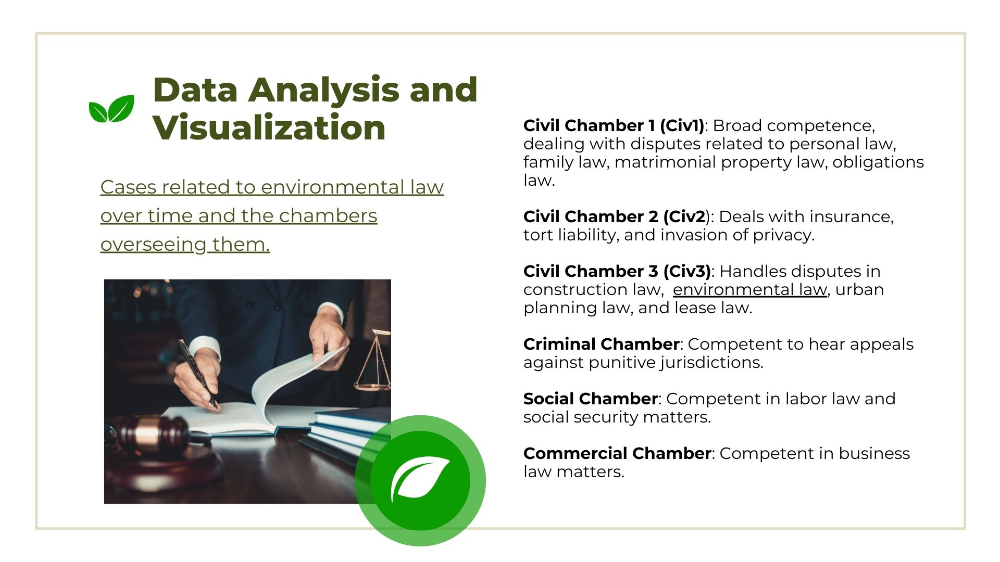

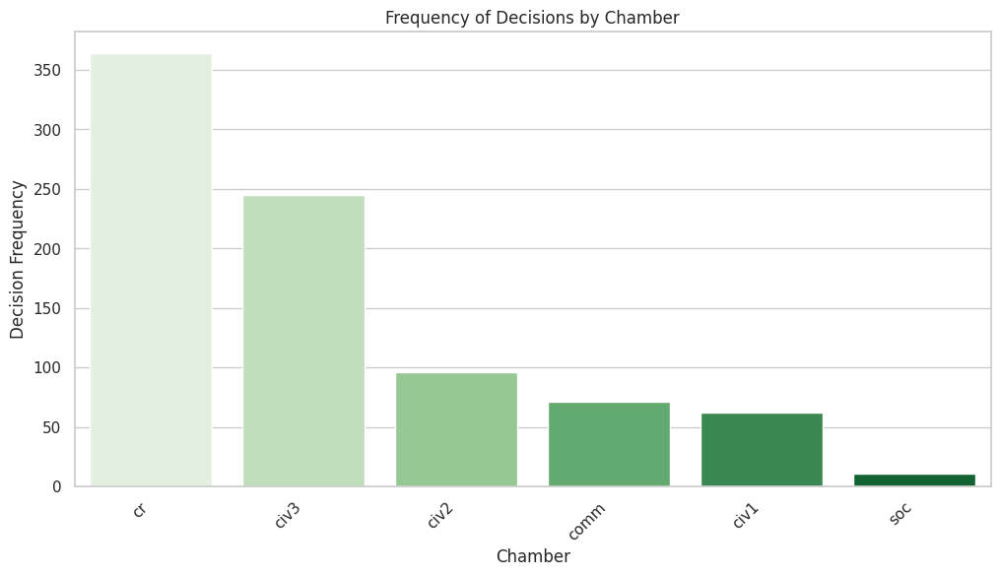

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

chamber_counts = df['chamber'].value_counts()

plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

sns.barplot(x=chamber_counts.index, y=chamber_counts.values, palette="Greens")

plt.title('Frequency of Decisions by Chamber')
plt.xlabel('Chamber')
plt.ylabel('Decision Frequency')

plt.xticks(rotation=45, ha='right')

plt.show()

In [ ]:
#We aim to generate a new column by extracting the year information from the existing Date column.

df['decision_date'] = pd.to_datetime(df['decision_date'])

df['year'] = df['decision_date'].dt.year

df.head(15)

,score,highlights,id,jurisdiction,chamber,number,numbers,ecli,formation,publication,decision_date,solution,type,summary,themes,files,titlesAndSummaries,solution_alt,year
0,1.000000,{'text': ['du <em>code</em> <em>de</em> <em>l'...,5fca33d40c7b4623bd8b0b23,cc,civ2,19-14.395,[19-14.395],ECLI:FR:CCASS:2020:C200885,fs,[b],2020-09-24,rejet,other,Aux termes de l'article L. 426-6 du code de l'...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],,2020
1,0.989978,{'text': ['agréée <em>de</em> protection <em>d...,63870194bf732905d49c4ff7,cc,civ3,21-16.404,[21-16.404],ECLI:FR:CCASS:2022:C300825,fs,[b],2022-11-30,rejet,other,La recevabilité de l'action en responsabilité ...,[protection de la nature et de l'environnement...,[],[],,2022
2,0.981522,{'text': ['En application des dispositions <em...,5fca824e891737725cb435fc,cc,civ2,17-31.372,[17-31.372],ECLI:FR:CCASS:2018:C201354,frh,[b],2018-10-25,cassation,other,Il résulte de l'article R. 426-11 du code de l...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],,2018
3,0.976780,{'text': ['Vu l'article L. 422-21- I-1° du <em...,607967229ba5988459c4994c,cc,civ3,10-13.848,[10-13.848],ECLI:FR:CCASS:2011:C301103,,[b],2011-09-28,cassation,arret,L'admission à une association communale de cha...,"[chasse, associations communales et intercommu...",[],[],,2011
4,0.976114,{'text': ['d'avoir dit que la prescription <em...,607982ce9ba5988459c4a425,cc,civ2,14-15.675,[14-15.675],ECLI:FR:CCASS:2015:C200510,,[b],2015-03-26,cassation,arret,Il résulte des articles L. 426-5 et L. 426-7 d...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],,2015
5,0.964611,{'text': ['perte <em>de</em> récolte qu'elle a...,5fd90080c97aca97177a9c30,cc,civ2,16-21.242,[16-21.242],ECLI:FR:CCASS:2017:C200863,frh,[b],2017-06-08,rejet,other,La perte de récolte au sens de l'article L. 42...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],,2017
6,0.961976,"{'text': ['janvier 2020, qui, pour infraction ...",5ffc65421a66d03ecfaa7cdf,cc,cr,20-80.972,[20-80.972],ECLI:FR:CCASS:2021:CR00003,frh,[b],2021-01-05,rejet,other,"Lorsqu'une disposition législative, support lé...","[lois et reglements, application dans le temps...",[],[],,2021
7,0.959152,"{'text': ['civile, ensemble les articles L. 55...",620ca2d5c61f23729bcf61e0,cc,civ3,21-11.926,[21-11.926],ECLI:FR:CCASS:2022:C300161,fs,[b],2022-02-16,rejet,other,Les règles du code de l'environnement relative...,[protection de la nature et de l'environnement...,[],[],,2022
8,0.958785,{'text': ['du <em>code</em> <em>de</em> <em>l'...,60795cb29ba5988459c4952e,cc,civ3,09-11.333,[09-11.333],ECLI:FR:CCASS:2009:C301453,,[b],2009-12-09,rejet,arret,L'article L. 422-21-I du code de l'environneme...,"[chasse, associations communales et intercommu...",[],[],,2009
9,0.955840,{'text': ['l'article L. 515-8 du <em>code</em>...,607951fc9ba5988459c490fc,cc,civ3,07-17.879,[07-17.879],ECLI:FR:CCASS:2008:C301258,,[b],2008-12-03,rejet,arret,C'est à bon droit qu'une cour d'appel indemnis...,[protection de la nature et de l'environnement...,[],[],,2008


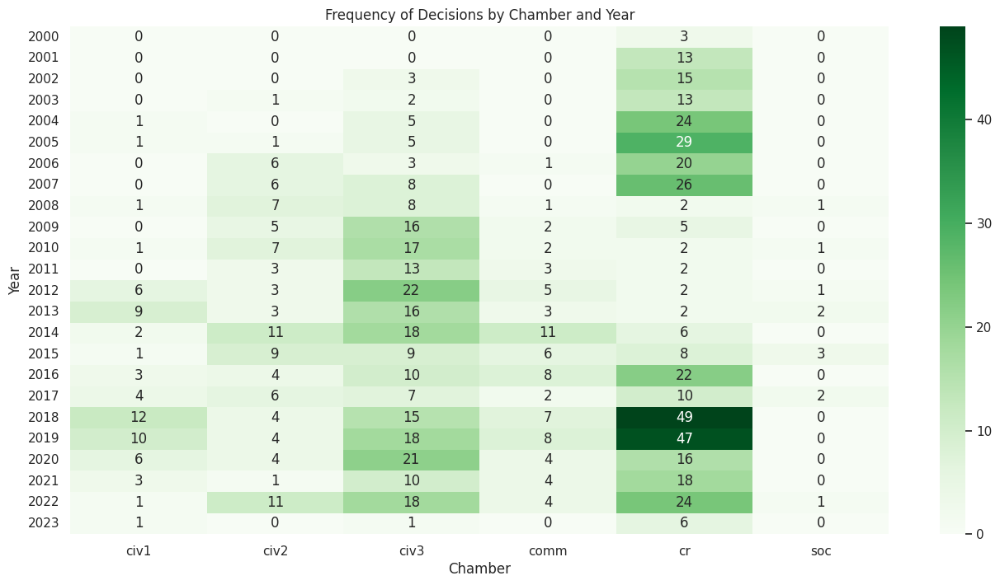

In [ ]:
import matplotlib.pyplot as plt

chamber_counts_by_year = df.groupby(['year', 'chamber']).size().unstack(fill_value=0)

plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")

sns.heatmap(chamber_counts_by_year, cmap="Greens", annot=True, fmt='d')

plt.title('Frequency of Decisions by Chamber and Year')
plt.xlabel('Chamber')
plt.ylabel('Year')

plt.show()

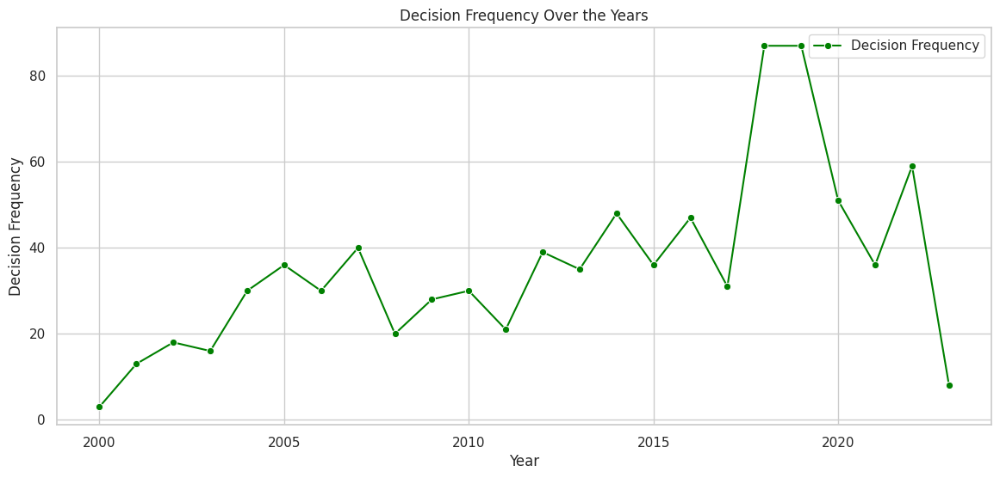

In [ ]:
from textblob import TextBlob

df['decision_year'] = pd.to_datetime(df['decision_date']).dt.year

decision_counts = df['decision_year'].value_counts().sort_index()

plt.figure(figsize=(14, 6))
sns.set(style="whitegrid")
sns.lineplot(x=decision_counts.index, y=decision_counts.values, marker='o', color='green', label='Decision Frequency')

plt.title('Decision Frequency Over the Years')
plt.xlabel('Year')
plt.ylabel('Decision Frequency')

plt.legend()
plt.show()

Our current objective is to analyze the most frequently utilized articles and sections of the code. To achieve this, we will extract all the articles from the summary column.

In [ ]:
from collections import Counter
df['necolumn'] = df['summary'].apply(lambda x: Counter(re.findall(r'([R|L]. d\d\d-\d)',x)))
print(df['summary'].head(15))
Counter(df['summary'].str.extract(r'([R|L]. [1-7]\d\d-\d)', expand=False))

0     Aux termes de l'article L. 426-6 du code de l'...
1     La recevabilité de l'action en responsabilité ...
2     Il résulte de l'article R. 426-11 du code de l...
3     L'admission à une association communale de cha...
4     Il résulte des articles L. 426-5 et L. 426-7 d...
5     La perte de récolte au sens de l'article L. 42...
6     Lorsqu'une disposition législative, support lé...
7     Les règles du code de l'environnement relative...
8     L'article L. 422-21-I du code de l'environneme...
9     C'est à bon droit qu'une cour d'appel indemnis...
10    Justifie sa décision la cour d'appel qui, pour...
11    L'article L. 218-15 du code de l'environnement...
12    Le prononcé par le juge des libertés et de la ...
13    Les infractions aux dispositions des articles ...
14    Une cour d'appel énonce à bon droit que l'arti...
Name: summary, dtype: object


Counter({'L. 426-6': 2,
         'L. 142-2': 3,
         'R. 426-1': 2,
         'L. 422-2': 6,
         'L. 426-5': 2,
         'L. 426-1': 4,
         nan: 734,
         'L. 515-1': 4,
         'R. 211-1': 1,
         'L. 218-1': 2,
         'L. 216-1': 1,
         'L. 216-5': 1,
         'L. 541-1': 2,
         'L. 426-7': 1,
         'R. 226-1': 1,
         'L. 511-1': 4,
         'L. 125-5': 2,
         'L. 215-1': 2,
         'R. 541-1': 1,
         'L. 515-8': 1,
         'L. 172-5': 2,
         'L. 415-3': 2,
         'L. 596-2': 1,
         'L. 411-1': 2,
         'L. 514-5': 1,
         'L. 426-4': 1,
         'L. 432-2': 1,
         'R. 226-2': 1,
         'L. 514-1': 4,
         'L. 541-3': 1,
         'L. 362-3': 1,
         'L. 213-2': 1,
         'L. 581-2': 1,
         'L. 424-3': 2,
         'L. 514-2': 6,
         'L. 162-9': 1,
         'L. 541-2': 3,
         'R. 425-3': 1,
         'R. 424-2': 1,
         'L. 122-7': 1,
         'R. 428-2': 1,
         'L. 214-3': 


Visualizing this data in a graph might be challenging for clarity, so let's proceed with the analysis without including the "alinéas" (subsections).

In [ ]:
from collections import Counter
df['necolumn'] = df['summary'].apply(lambda x: Counter(re.findall(r'([R|L]. d\d\d)',x)))
print(df['summary'].head(15))
Counter(df['summary'].str.extract(r'([R|L]. [1-7]\d\d)', expand=False))

0     Aux termes de l'article L. 426-6 du code de l'...
1     La recevabilité de l'action en responsabilité ...
2     Il résulte de l'article R. 426-11 du code de l...
3     L'admission à une association communale de cha...
4     Il résulte des articles L. 426-5 et L. 426-7 d...
5     La perte de récolte au sens de l'article L. 42...
6     Lorsqu'une disposition législative, support lé...
7     Les règles du code de l'environnement relative...
8     L'article L. 422-21-I du code de l'environneme...
9     C'est à bon droit qu'une cour d'appel indemnis...
10    Justifie sa décision la cour d'appel qui, pour...
11    L'article L. 218-15 du code de l'environnement...
12    Le prononcé par le juge des libertés et de la ...
13    Les infractions aux dispositions des articles ...
14    Une cour d'appel énonce à bon droit que l'arti...
Name: summary, dtype: object


Counter({'L. 426': 10,
         'L. 142': 3,
         'R. 426': 2,
         'L. 422': 6,
         nan: 733,
         'L. 515': 5,
         'R. 211': 1,
         'L. 218': 5,
         'L. 216': 4,
         'L. 541': 7,
         'R. 226': 2,
         'L. 511': 4,
         'L. 125': 2,
         'L. 215': 2,
         'R. 541': 1,
         'L. 172': 2,
         'L. 415': 2,
         'L. 596': 1,
         'L. 411': 2,
         'L. 514': 11,
         'L. 432': 1,
         'L. 362': 1,
         'L. 213': 2,
         'L. 581': 1,
         'L. 424': 5,
         'L. 162': 1,
         'R. 425': 1,
         'R. 424': 1,
         'L. 122': 1,
         'R. 428': 1,
         'L. 214': 2,
         'L. 421': 3,
         'L. 480': 4,
         'L. 533': 1,
         'L. 420': 1,
         'R. 241': 1,
         'L. 143': 1,
         'R. 512': 1,
         'R. 422': 1,
         'R. 221': 1,
         'L. 242': 1,
         'L. 221': 1,
         'L. 229': 1,
         'L. 210': 1,
         'L. 145': 1,
         'L

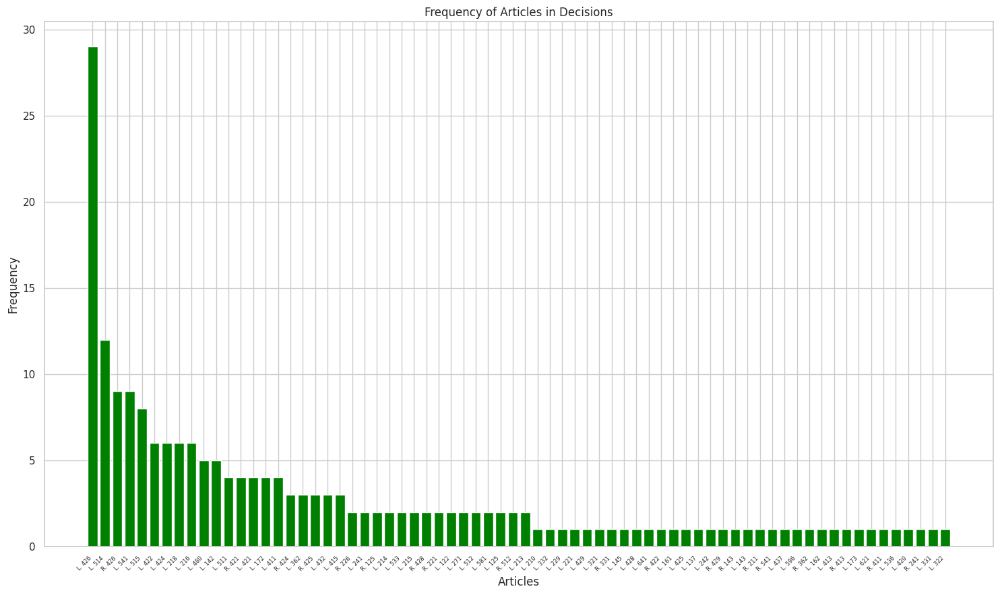

In [ ]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

pattern_counts1 = Counter(df['summary'].apply(lambda x: re.findall(r'([R|L]. d\d\d)', x)).sum())
pattern_counts2 = Counter(df['summary'].str.extractall(r'([R|L]\. [1-7]\d\d)')[0])


combined_counts = pattern_counts1 + pattern_counts2


result_df = pd.DataFrame.from_dict(combined_counts, orient='index', columns=['Count'])
result_df.index.name = 'Pattern'

result_df.sort_values('Count', ascending=False, inplace=True)

plt.figure(figsize=(15, 9))
plt.bar(result_df.index, result_df['Count'], color='green')
plt.xlabel('Articles')
plt.ylabel('Frequency')
plt.title('Frequency of Articles in Decisions')
plt.xticks(rotation=45, ha='right', fontsize=6)

plt.tight_layout()

plt.show()


Since the graph is not easily readable, we've opted to make some slight modifications. We've chosen to display only the top 20 most mentioned articles and have highlighted the color of the largest bar.

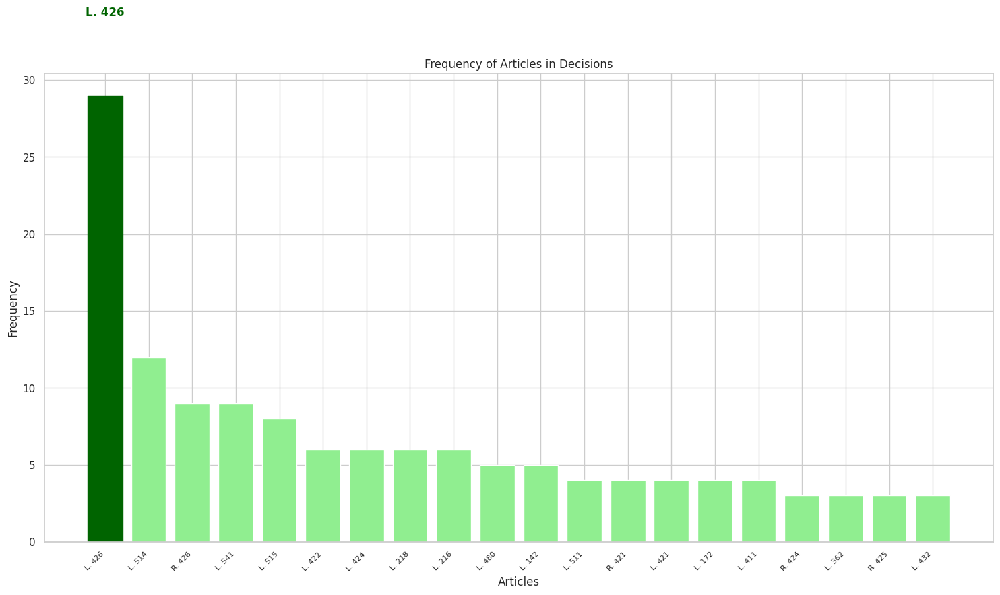

In [ ]:
import re

pattern_counts1 = Counter(df['summary'].apply(lambda x: re.findall(r'([R|L]. d\d\d)', x)).sum())
pattern_counts2 = Counter(df['summary'].str.extractall(r'([R|L]\. [1-7]\d\d)')[0])

combined_counts = pattern_counts1 + pattern_counts2

result_df = pd.DataFrame.from_dict(combined_counts, orient='index', columns=['Count'])
result_df.index.name = 'Article Pattern'


result_df.sort_values('Count', ascending=False, inplace=True)


result_df_head = result_df.head(20)

most_frequent_label = result_df_head['Count'].idxmax()


plt.figure(figsize=(15, 9))
bars = plt.bar(result_df_head.index, result_df_head['Count'], color='lightgreen')
plt.xlabel('Articles')
plt.ylabel('Frequency')
plt.title('Frequency of Articles in Decisions')
plt.xticks(rotation=45, ha='right', fontsize=8)

for bar, label in zip(bars, result_df_head.index):
    if label == most_frequent_label:
        bar.set_color('darkgreen')
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5, label, ha='center', va='bottom', fontweight='bold', color='darkgreen')

plt.tight_layout()
plt.show()

Having recognized the significance of Article 426, we now aim to identify the specific subsections within it that are most frequently referenced.

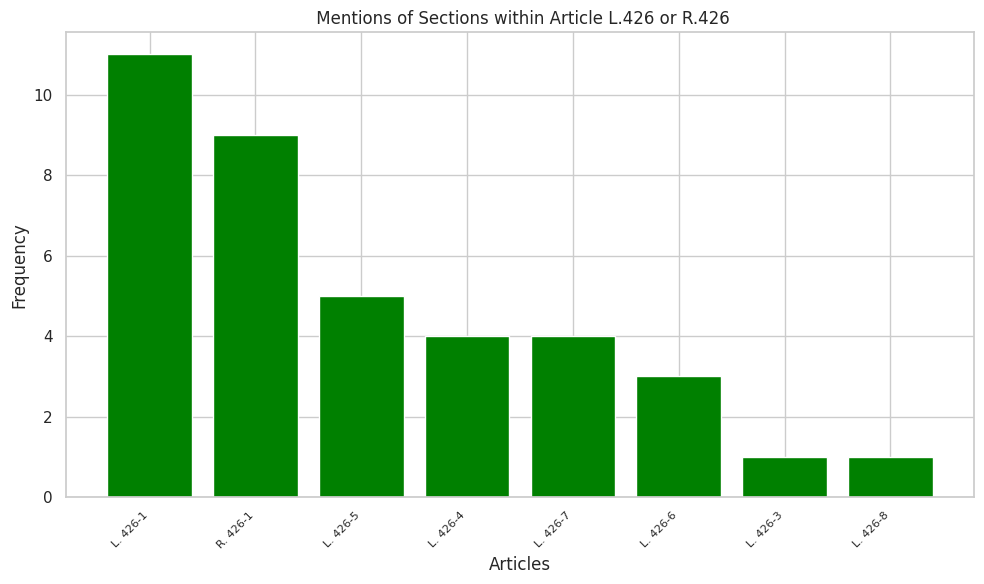

In [ ]:

pattern_counts = Counter(df['summary'].apply(lambda x: re.findall(r'([R|L]\. 426-\d)', x)).sum())

result_df = pd.DataFrame.from_dict(pattern_counts, orient='index', columns=['Count'])
result_df.index.name = 'Pattern'


result_df.sort_values('Count', ascending=False, inplace=True)

plt.figure(figsize=(10, 6))
bars = plt.bar(result_df.index, result_df['Count'], color='green')

plt.xlabel('Articles')
plt.ylabel('Frequency')
plt.title(' Mentions of Sections within Article L.426 or R.426')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.tight_layout()

plt.show()

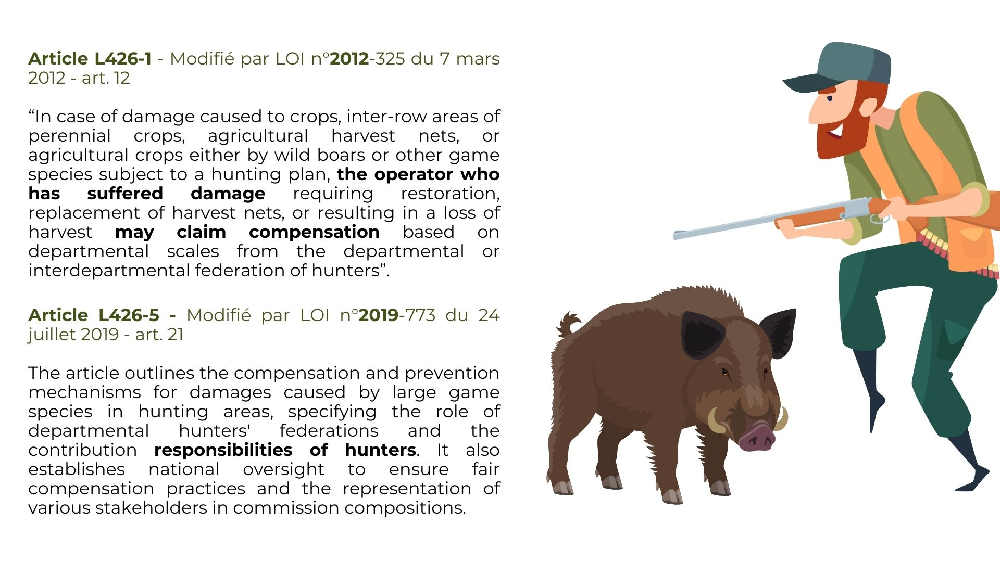

Now, our objective is to analyze the themes of each decision to determine the types of environmental law cases that are elevated to the Cour de Cassation.

In [ ]:
pip install wordcloud

We will examine the evolution of the key themes addressed by the Cour de Cassation in environmental cases over the past two decades. This analysis will involve the use of word clouds and clustering techniques.

In [ ]:
pip install nltk

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


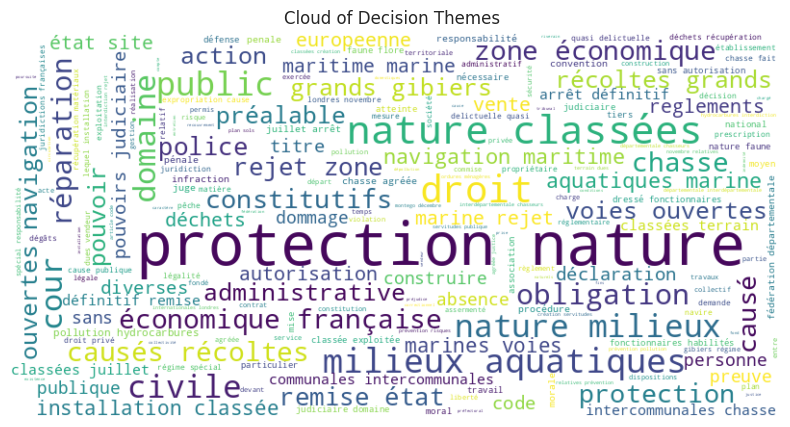

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

import nltk
nltk.download('stopwords')
nltk.download('punkt')

all_themes = ' '.join(df['themes'].astype(str))

words = word_tokenize(all_themes)

stop_words = set(stopwords.words('french'))
filtered_words = [word.lower() for word in words if word.isalpha() and len(word) >= 4 and word.lower() not in stop_words]

filtered_themes = ' '.join(filtered_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(filtered_themes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Cloud of Decision Themes ')
plt.show()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


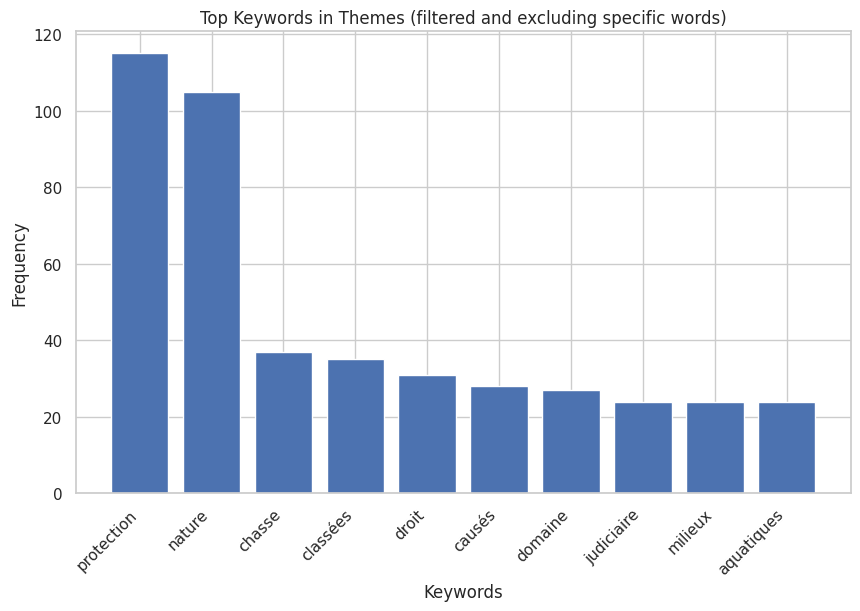

In [ ]:

#We have opted against using this graph as it would be challenging to filter out all the irrelevant words for our project. Therefore, let's dismiss  it.

from collections import Counter

import nltk
nltk.download('stopwords')
nltk.download('punkt')

all_themes = ' '.join(df['themes'].astype(str))

words = word_tokenize(all_themes)

stop_words = set(stopwords.words('french'))
filtered_words = [word.lower() for word in words if word.isalpha() and len(word) >= 4 and word.lower() not in stop_words]

word_counts = Counter(filtered_words)


top_words = word_counts.most_common(10)

plt.figure(figsize=(10, 6))
plt.bar(*zip(*top_words))
plt.title('Top Keywords in Themes (filtered and excluding specific words)')
plt.xlabel('Keywords')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


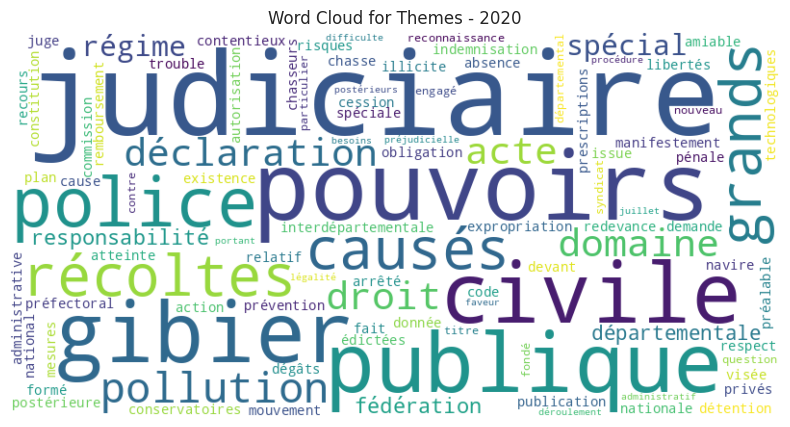

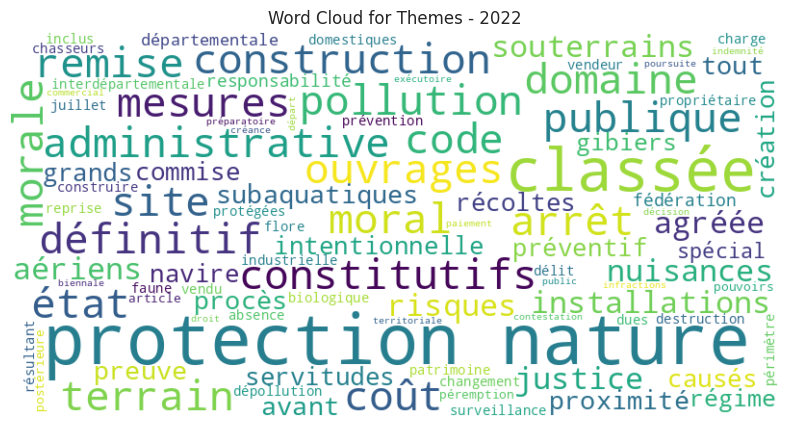

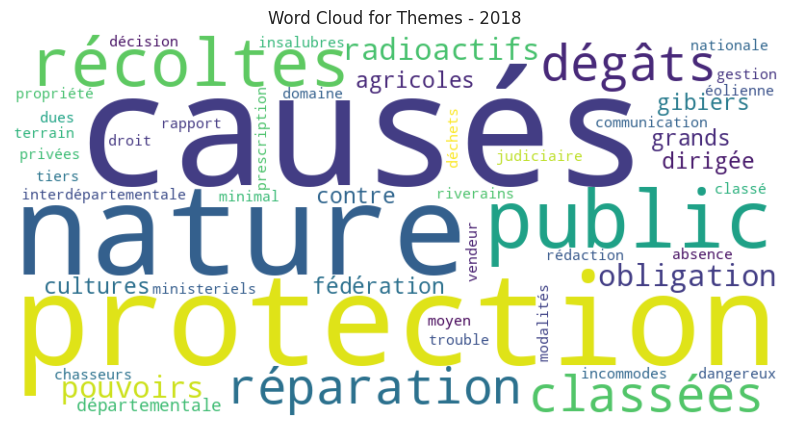

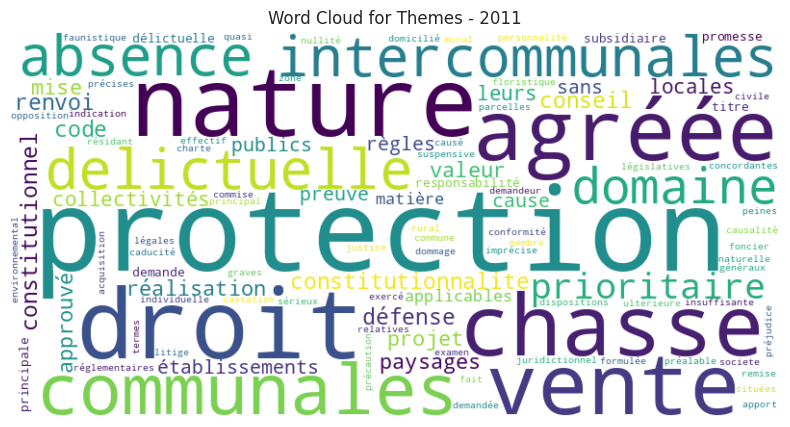

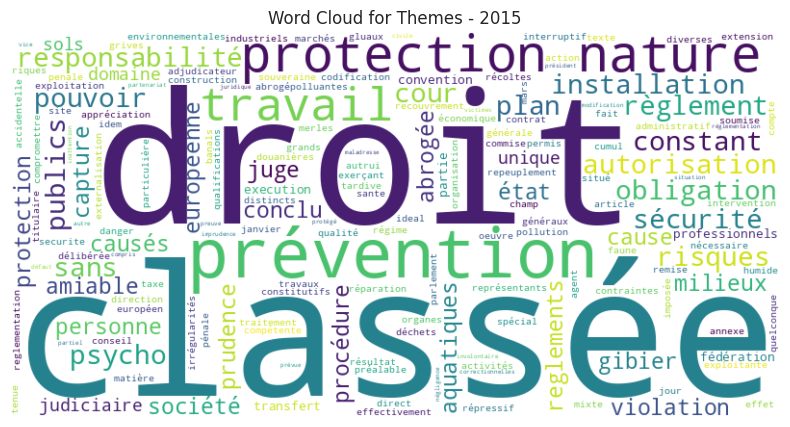

...

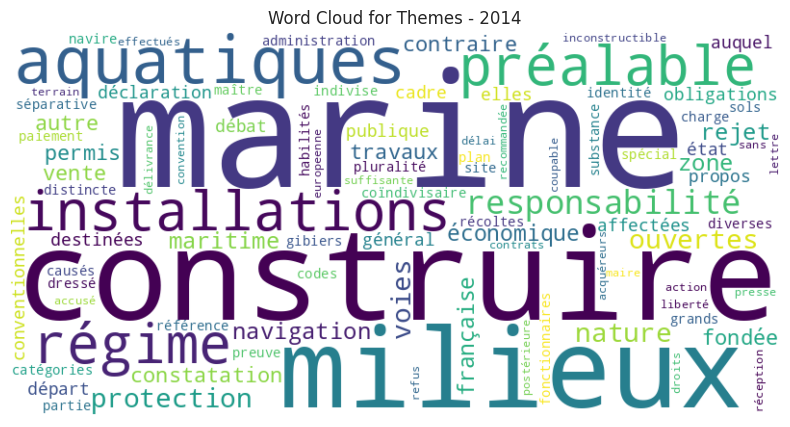

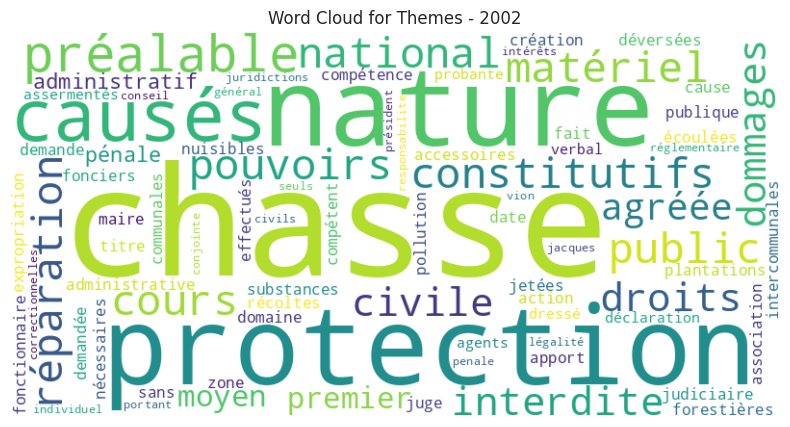

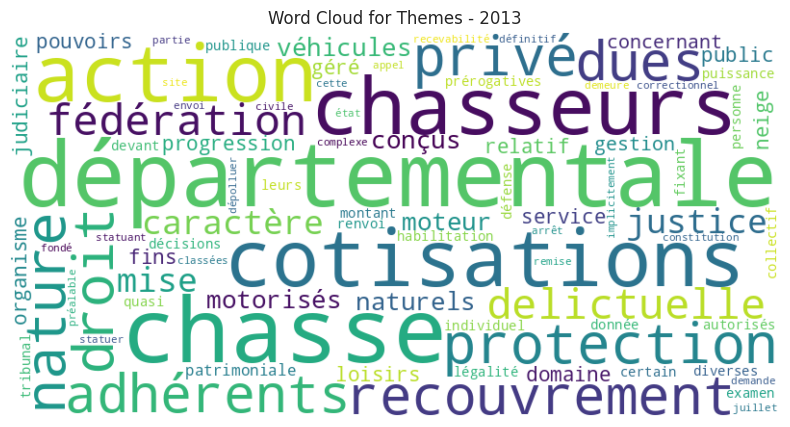

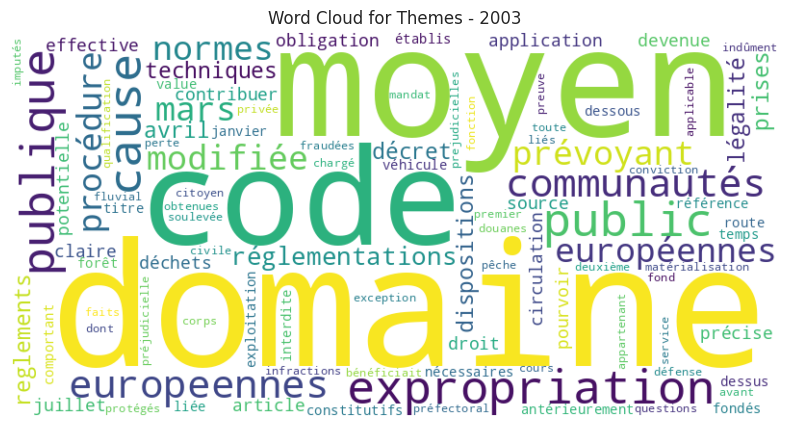

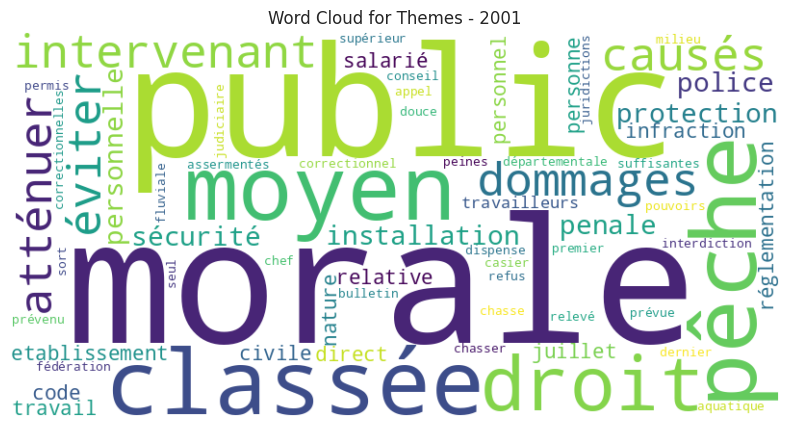

ValueError: ignored

In [ ]:

from collections import Counter

import nltk
nltk.download('stopwords')
nltk.download('punkt')

df['decision_year'] = pd.to_datetime(df['decision_date']).dt.year


unique_years = df['decision_year'].unique()


for year in unique_years:
    themes_year = ' '.join(df[df['decision_year'] == year]['themes'].astype(str))

    words_year = word_tokenize(themes_year)
    stop_words = set(stopwords.words('french'))
    filtered_words_year = [word.lower() for word in words_year if word.isalpha() and len(word) >= 4 and word.lower() not in stop_words]

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(filtered_words_year))

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Themes - {year}')
    plt.show()

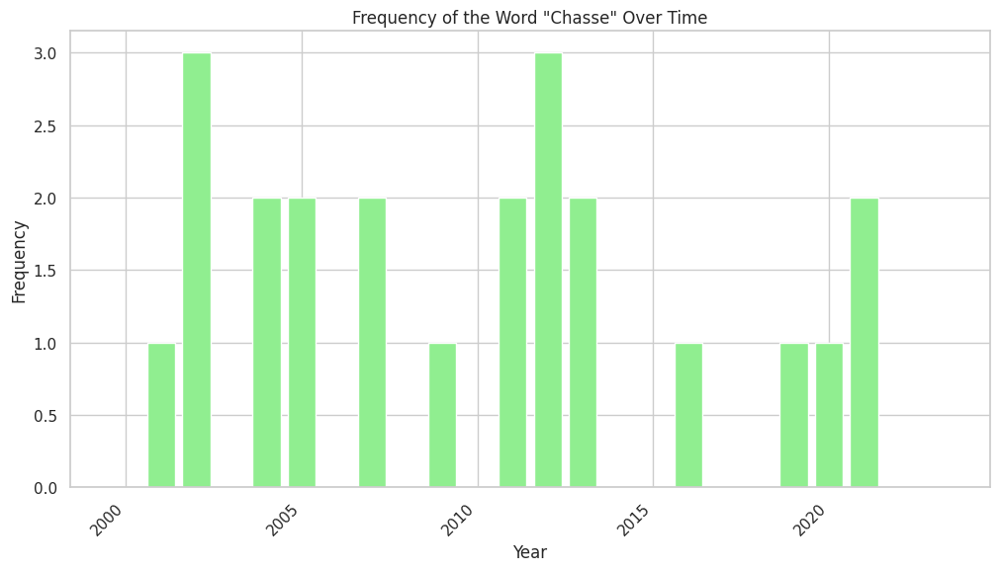

In [ ]:

df['decision_year'] = pd.to_datetime(df['decision_date']).dt.year

word_counts_by_year = df.groupby(['decision_year'])['themes'].apply(lambda x: sum('chasse' in word_tokenize(str(theme).lower()) for theme in x)).reset_index(name='chasse_frequency')

plt.figure(figsize=(12, 6))
plt.bar(word_counts_by_year['decision_year'], word_counts_by_year['chasse_frequency'], color='lightgreen')


plt.title('Frequency of the Word "Chasse" Over Time')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')


plt.show()

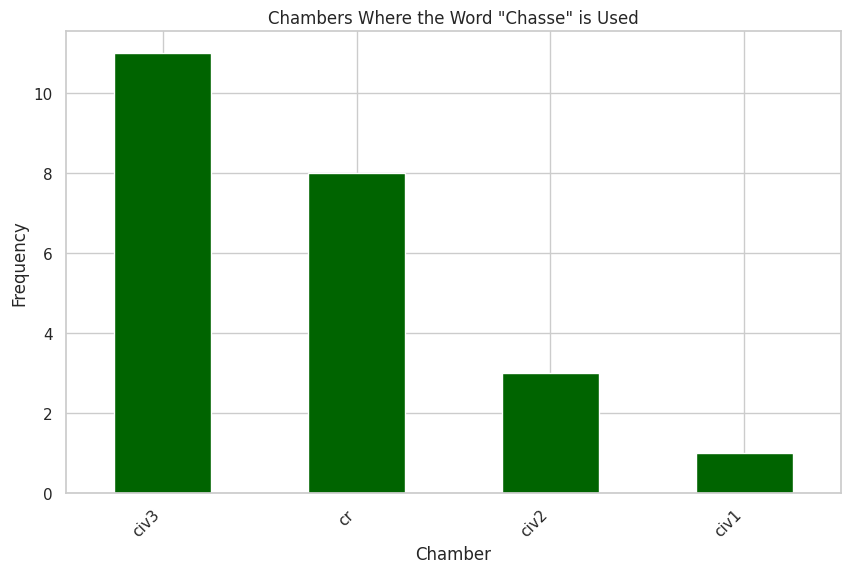

In [ ]:
import pandas as pd
from nltk.tokenize import word_tokenize

chasse_rows = df[df['themes'].apply(lambda x: 'chasse' in word_tokenize(str(x).lower()))]

chamber_counts = chasse_rows['chamber'].value_counts()

plt.figure(figsize=(10, 6))
chamber_counts.plot(kind='bar', color='darkgreen')

plt.title('Chambers Where the Word "Chasse" is Used')
plt.xlabel('Chamber')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')


plt.show()

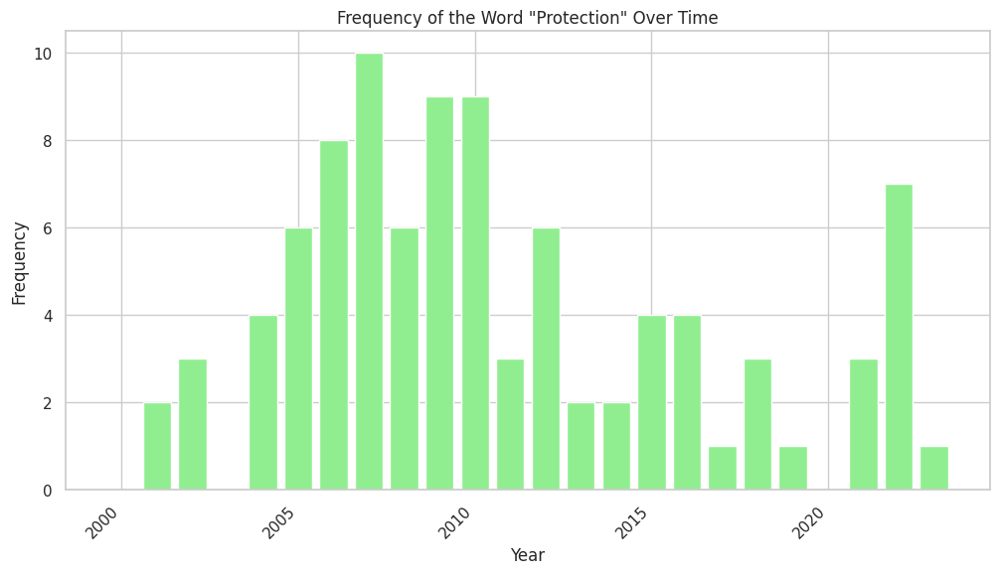

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize

df['decision_year'] = pd.to_datetime(df['decision_date']).dt.year

word_counts_by_year = df.groupby(['decision_year'])['themes'].apply(lambda x: sum('protection' in word_tokenize(str(theme).lower()) for theme in x)).reset_index(name='protection_frequency')

plt.figure(figsize=(12, 6))
plt.bar(word_counts_by_year['decision_year'], word_counts_by_year['protection_frequency'], color='lightgreen')

plt.title('Frequency of the Word "Protection" Over Time')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')

plt.show()

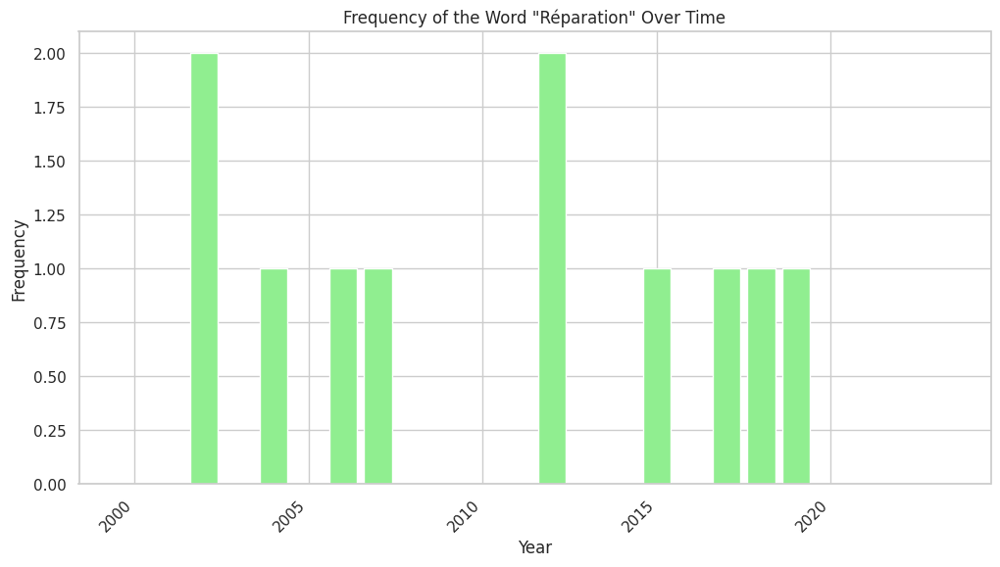

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize


df['decision_year'] = pd.to_datetime(df['decision_date']).dt.year
word_counts_by_year = df.groupby(['decision_year'])['themes'].apply(lambda x: sum('réparation' in word_tokenize(str(theme).lower()) for theme in x)).reset_index(name='réparation_frequency')

plt.figure(figsize=(12, 6))
plt.bar(word_counts_by_year['decision_year'], word_counts_by_year['réparation_frequency'], color='lightgreen')

plt.title('Frequency of the Word "Réparation" Over Time')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')

plt.show()

In [ ]:
df.head(3)

,score,highlights,id,jurisdiction,chamber,number,numbers,ecli,formation,publication,...,solution,type,summary,themes,files,titlesAndSummaries,solution_alt,year,decision_year,necolumn
0,1.000000,{'text': ['du <em>code</em> <em>de</em> <em>l'...,5fca33d40c7b4623bd8b0b23,cc,civ2,19-14.395,[19-14.395],ECLI:FR:CCASS:2020:C200885,fs,[b],...,rejet,other,Aux termes de l'article L. 426-6 du code de l'...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],,2020,2020,{}
1,0.989978,{'text': ['agréée <em>de</em> protection <em>d...,63870194bf732905d49c4ff7,cc,civ3,21-16.404,[21-16.404],ECLI:FR:CCASS:2022:C300825,fs,[b],...,rejet,other,La recevabilité de l'action en responsabilité ...,[protection de la nature et de l'environnement...,[],[],,2022,2022,{}
2,0.981522,{'text': ['En application des dispositions <em...,5fca824e891737725cb435fc,cc,civ2,17-31.372,[17-31.372],ECLI:FR:CCASS:2018:C201354,frh,[b],...,cassation,other,Il résulte de l'article R. 426-11 du code de l...,"[chasse, gibier, dégâts causés aux récoltes, s...",[],[],,2018,2018,{}



We will employ clustering techniques to analyze the relationships between different topics.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans


text_columns = ['themes']
df['combined_text'] = df[text_columns].apply(lambda x: ' '.join(map(str, x)), axis=1)

tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df['combined_text'])

num_clusters = 5  # Adjustable
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(tfidf_matrix)

clusters = kmeans.labels_

df['Cluster'] = clusters

num_clusters = 5  # Adjustable
n_init_value = 10

kmeans = KMeans(n_clusters=num_clusters, n_init=n_init_value)
kmeans.fit(tfidf_matrix)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=5, n_init=10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


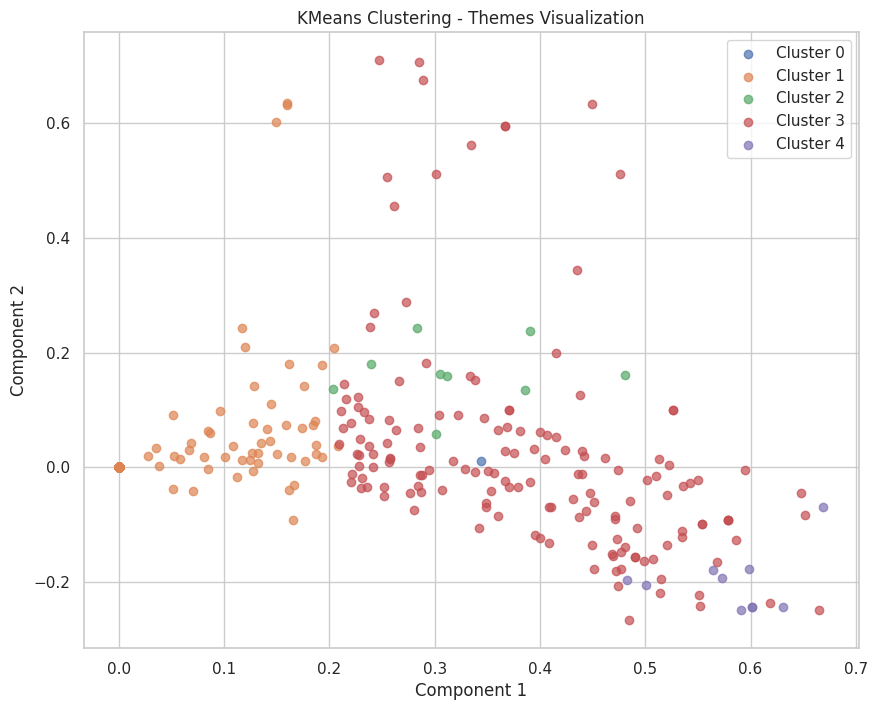

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


df['themes'] = df['themes'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df['themes'])


num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(tfidf_matrix)
clusters = kmeans.labels_

from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=2)
themes_reduced = svd.fit_transform(tfidf_matrix)

plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_data = themes_reduced[clusters == cluster_label]
    plt.scatter(
        cluster_data[:, 0],
        cluster_data[:, 1],
        label=f'Cluster {cluster_label}',
        alpha=0.7,
    )

plt.title('KMeans Clustering - Themes Visualization')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()
plt.show()

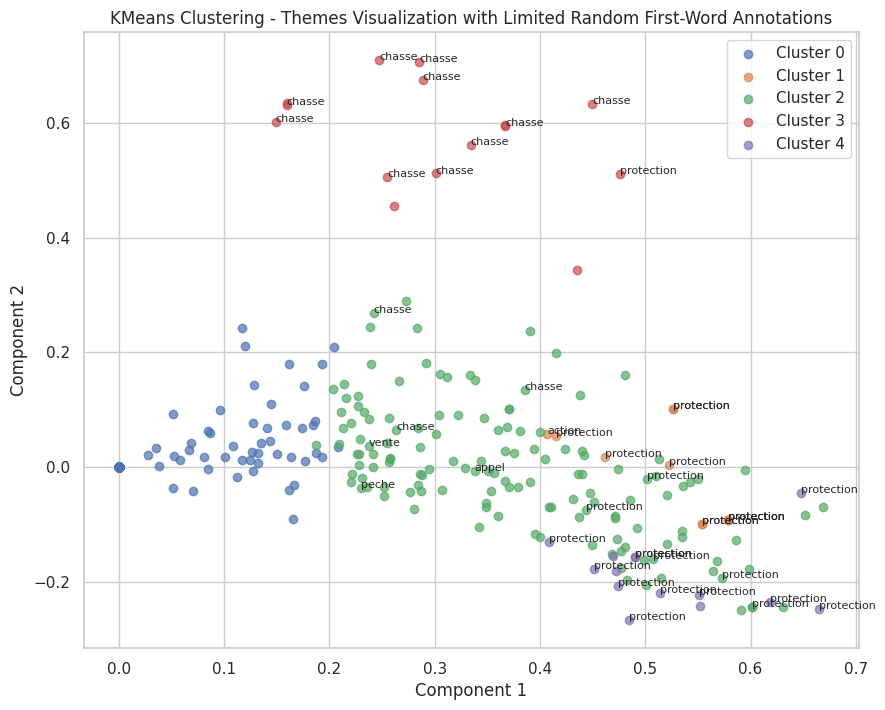

In [ ]:
import random
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

df['themes'] = df['themes'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df['themes'])

num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(tfidf_matrix)
clusters = kmeans.labels_

from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=2)
themes_reduced = svd.fit_transform(tfidf_matrix)

plt.figure(figsize=(10, 8))
for cluster_label in range(num_clusters):
    cluster_data = themes_reduced[clusters == cluster_label]
    plt.scatter(
        cluster_data[:, 0],
        cluster_data[:, 1],
        label=f'Cluster {cluster_label}',
        alpha=0.7,
    )

    annotations_to_display = 11 # Adjustable
    indices_to_annotate = random.sample(range(len(cluster_data)), min(annotations_to_display, len(cluster_data)))
    for i in indices_to_annotate:
        annotation_words = df[clusters == cluster_label]['themes'].iloc[i].split()
        first_word = annotation_words[0] if annotation_words else ''
        plt.text(cluster_data[i, 0], cluster_data[i, 1], first_word, fontsize=8)

plt.title('KMeans Clustering - Themes Visualization with Limited Random First-Word Annotations')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.legend()
plt.show()


We will now juxtapose our results with the political developments regarding this matter in Europe.

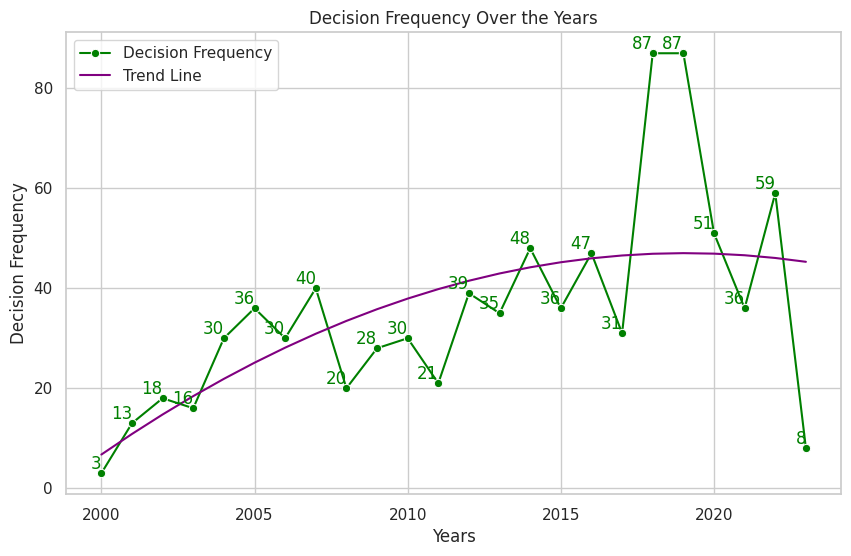

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

df['decision_year'] = pd.to_datetime(df['decision_date']).dt.year

decision_counts = df['decision_year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))

sns.lineplot(x=decision_counts.index, y=decision_counts.values, marker='o', color='green', label='Decision Frequency')

for i, count in enumerate(decision_counts.values):
    plt.text(decision_counts.index[i], count, f"{count}", ha='right', va='bottom', color='green')

poly_fit = np.poly1d(np.polyfit(decision_counts.index, decision_counts.values, 2))
plt.plot(decision_counts.index, poly_fit(decision_counts.index), linestyle='-', color='purple', label='Trend Line')

plt.xlabel('Years')
plt.ylabel('Decision Frequency')
plt.title('Decision Frequency Over the Years')

# Show the plot
plt.legend()
plt.show()

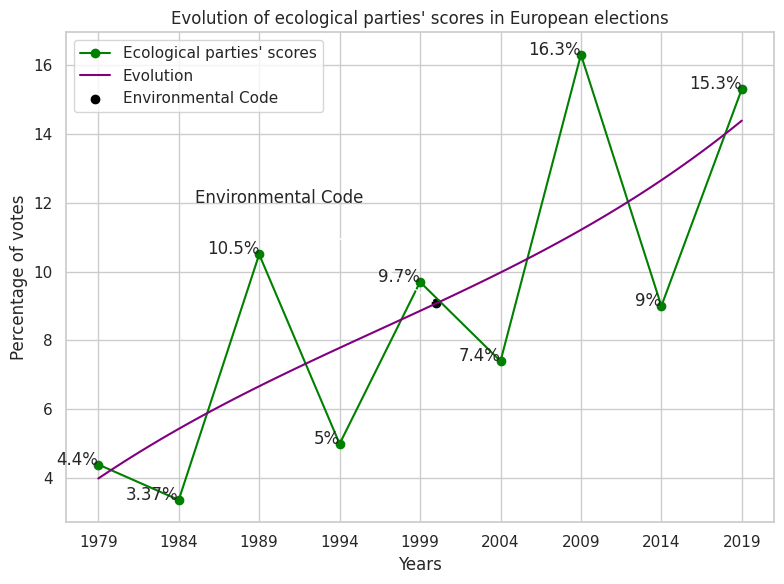

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

years = [1979, 1984, 1989, 1994, 1999, 2004, 2009, 2014, 2019]
ecological_scores = [4.4, 3.37, 10.5, 5, 9.7, 7.4, 16.3, 9, 15.3]

plt.figure(figsize=(8, 6))
plt.plot(years, ecological_scores, marker='o', linestyle='-', label="Ecological parties' scores", color='green')
for i, score in enumerate(ecological_scores):
    plt.text(years[i], score, f"{score}%", ha='right')

poly_fit = np.poly1d(np.polyfit(years, ecological_scores, 3))
smooth_years = np.linspace(min(years), max(years), 100)
plt.plot(smooth_years, poly_fit(smooth_years), color='purple', label='Evolution')

score_2000 = poly_fit(2000)
plt.scatter(2000, score_2000, color='black', label='Environmental Code')
plt.annotate('Environmental Code', xy=(2000, score_2000), xytext=(1985, 12),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

plt.title("Evolution of ecological parties' scores in European elections")
plt.xlabel("Years")
plt.ylabel("Percentage of votes")
plt.grid(True)
plt.xticks(years)
plt.legend()
plt.tight_layout()

plt.show()

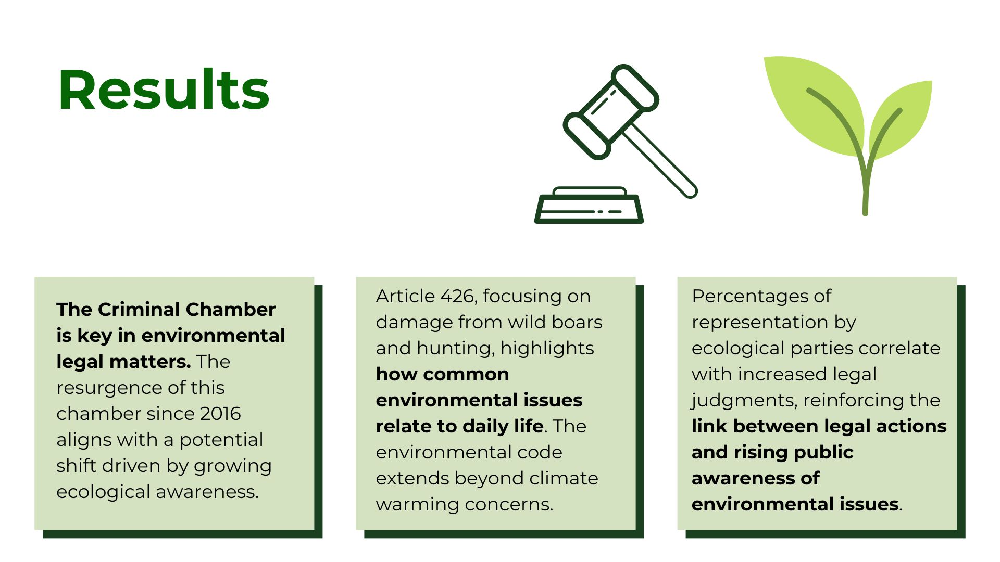